# Data Mining Technique

## Classification:

In [51]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
from sklearn import tree

df = pd.read_csv('Dataset/processed_data.csv')



In [52]:
fn = df.keys().tolist() [:-1]
X=df[fn]
y=df['NObeyesdad']


In [53]:
from sklearn.preprocessing import LabelEncoder
# encoding CAEC and CALC uniformly
encoding_mapping = {'10-15': 0, '16-20': 1, '21-25': 2 , '26-30' : 3 , '31+' : 4}

X.loc[:,'Age'] = X['Age'].map(encoding_mapping)


In [54]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Define partitions (train sizes) and criteria for attribute selection
train_sizes = [0.6, 0.7, 0.8]  # Different train sizes
criteria = ['gini', 'entropy']  # Selection criteria


# Gini Index:

>### Splitting Data into: 60% Training and 40% Test

Train Size: 60%, Criterion: gini, Accuracy: 0.38
Classification Report:
               precision    recall  f1-score   support

         1.0       0.28      0.27      0.27       119
         2.0       0.51      0.51      0.51       211
         3.0       0.16      0.17      0.16        71

    accuracy                           0.38       401
   macro avg       0.32      0.32      0.32       401
weighted avg       0.38      0.38      0.38       401



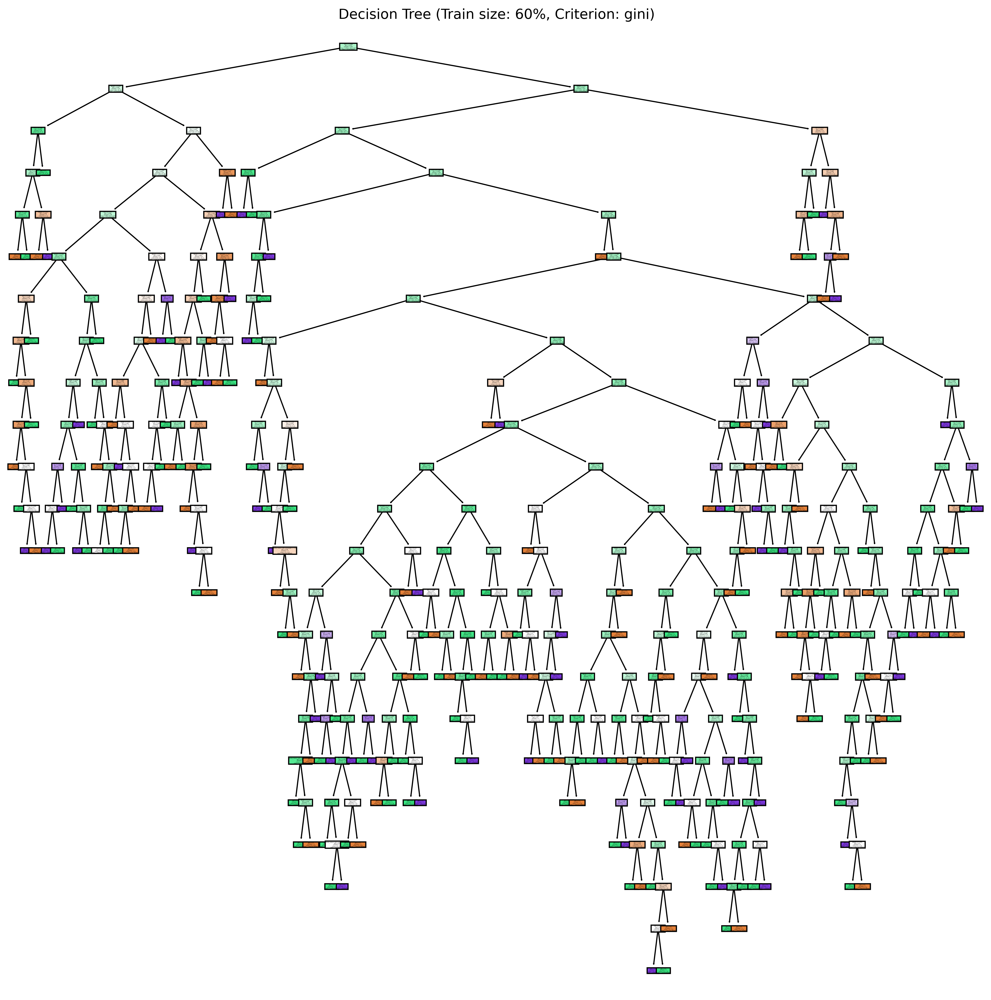

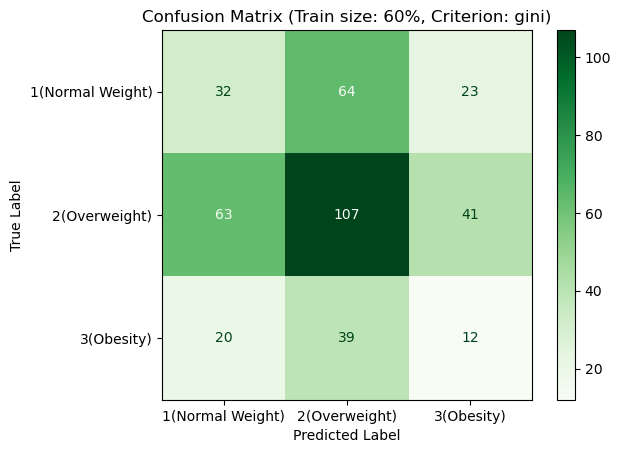

In [55]:

# First Train Size: 60%, Criterion: 'gini'
train_size = 0.6
criterion = 'gini'
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, random_state=42)

# Initialize and train the Decision Tree model
model = DecisionTreeClassifier(criterion=criterion, random_state=42)
model = model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Train Size: {int(train_size * 100)}%, Criterion: {criterion}, Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


# Visualize the tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 15), dpi=400)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
tree.plot_tree(model, 
          feature_names=fn,
          class_names=[class_labels[1] , class_labels[2], class_labels[3]], 
          filled=True, 

          )
plt.title(f"Decision Tree (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.show()

# Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[1], class_labels[2],class_labels[3]])
disp.plot(cmap=plt.cm.Greens)
plt.title(f"Confusion Matrix (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()




### Decision Tree: 

In this tree, the splitting process begins with the criterion of NCP (How many main meals do you have daily?), where samples are segregated based on their NCP values. The selection of features at each node is determined by their **Gini index** values.

Following the split on NCP, the tree considers another feature, dividing samples accordingly. Subsequently, this splitting procedure persists for each attribute, guided by their respective Gini index values at each level, until reaching the leaf nodes. These leaf nodes act as terminal points, providing the final classification (whether it indicates normal weight, overweight, or obesity) based on the path followed through the tree.


### confusion matrix:

The confusion matrix represents the performance measurement of the classification model. In this case, we have a 3x3 confusion matrix where each row represents the actual classification, and each column represents the predicted classification. From the results, it appears:<br>
The top-left cell: (32) Number of Normal Weight instances correctly classified as Normal Weight (True Negative for class 1).<br>
Middle cell (107): Number of Overweight instances correctly classified as Overweight (True Positive for class 2).<br>
Bottom-right cell (12): Number of Obesity instances correctly classified as Obesity (True Positive for class 3).<br>

Other cells represent misclassifications:<br>
Top-middle cell (64): Normal Weight instances incorrectly classified as Overweight<br>
Top-right cell (23): Normal Weight instances incorrectly classified as Obesity.<br>
Middle-left cell (63): Overweight instances incorrectly classified as Normal Weight.<br>
Middle-right cell (41): Overweight instances incorrectly classified as Obesity.<br>
Bottom-left cell (20): Obesity instances incorrectly classified as Normal Weight.<br>
Bottom-middle cell (39): Obesity instances incorrectly classified as Overweight.<br>

The diagonal elements (32, 107, and 12) represent correct classifications, while the off-diagonal elements represent the misclassifications.

### Accuracy: 

Accuracy is the proportion of correct predictions out of all predictions made by the model.
In this case, 38% accuracy means that out of all the predictions made on the test set (the remaining 40% of the data), only 38% were correct, which considerd as low accuracy.

>### Splitting Data into: 70% Training and 30% Test

Train Size: 70%, Criterion: gini, Accuracy: 0.40
Classification Report:
               precision    recall  f1-score   support

         1.0       0.25      0.22      0.24        90
         2.0       0.53      0.56      0.55       160
         3.0       0.19      0.20      0.19        51

    accuracy                           0.40       301
   macro avg       0.32      0.33      0.33       301
weighted avg       0.39      0.40      0.39       301



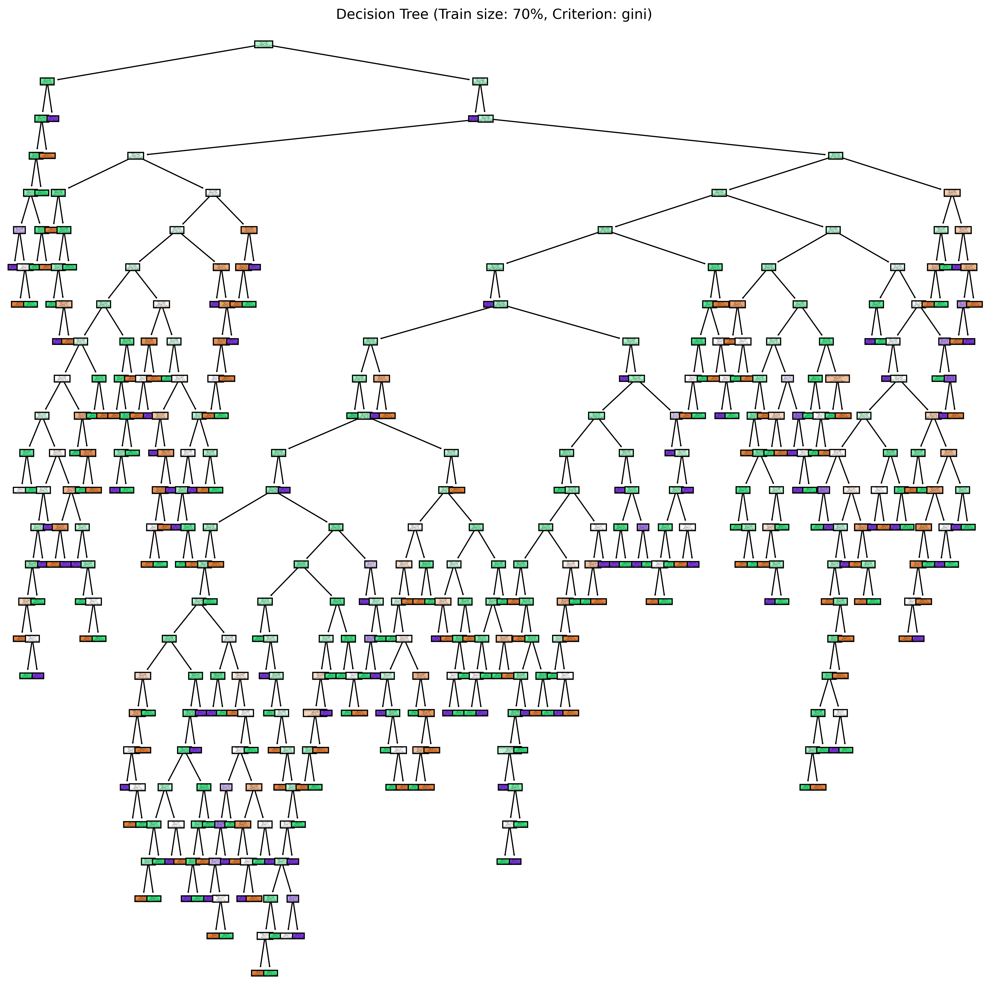

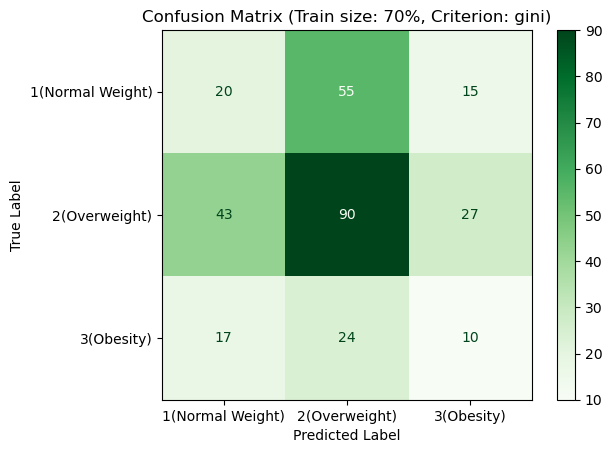

In [56]:

# Second Train Size: 70%, Criterion: 'gini'
train_size = 0.7
criterion = 'gini'
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, random_state=42)

# Initialize and train the Decision Tree model
model = DecisionTreeClassifier(criterion=criterion, random_state=42)
model = model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Train Size: {int(train_size * 100)}%, Criterion: {criterion}, Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


# Visualize the tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 15), dpi=400)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
tree.plot_tree(model, 
          feature_names=fn,
          class_names=[class_labels[1] , class_labels[2], class_labels[3]], 
          filled=True, 
        
          )
plt.title(f"Decision Tree (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.show()

# Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[1], class_labels[2],class_labels[3]])
disp.plot(cmap=plt.cm.Greens)
plt.title(f"Confusion Matrix (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()







### Decision Tree: 

In this tree, the splitting process begins with the criterion of FCVC ( Do you usually eat vegetables in your meals? ), where samples are segregated based on their FCVC values. The selection of features at each node is determined by their **Gini index** values.

Following the split on FCVC, the tree considers another feature, dividing samples accordingly. Subsequently, this splitting procedure persists for each attribute, guided by their respective Gini index values at each level, until reaching the leaf nodes. These leaf nodes act as terminal points, providing the final classification (whether it indicates normal weight, overweight, or obesity) based on the path followed through the tree.


### confusion matrix:

The confusion matrix represents the performance measurement of the classification model. In this case, we have a 3x3 confusion matrix where each row represents the actual classification, and each column represents the predicted classification. From the results, it appears:<br>
The top-left cell: (20) Number of Normal Weight instances correctly classified as Normal Weight (True Negative for class 1).<br>
Middle cell (90): Number of Overweight instances correctly classified as Overweight (True Positive for class 2).<br>
Bottom-right cell (10): Number of Obesity instances correctly classified as Obesity (True Positive for class 3).<br>

Other cells represent misclassifications:<br>
Top-middle cell (55): Normal Weight instances incorrectly classified as Overweight<br>
Top-right cell (15): Normal Weight instances incorrectly classified as Obesity.<br>
Middle-left cell (43): Overweight instances incorrectly classified as Normal Weight.<br>
Middle-right cell (27): Overweight instances incorrectly classified as Obesity.<br>
Bottom-left cell (17): Obesity instances incorrectly classified as Normal Weight.<br>
Bottom-middle cell (24): Obesity instances incorrectly classified as Overweight.<br>

The diagonal elements (20, 90, and 10) represent correct classifications, while the off-diagonal elements represent the misclassifications.

### Accuracy: 

Accuracy is the proportion of correct predictions out of all predictions made by the model.
In this case, 40% accuracy means that out of all the predictions made on the test set (the remaining 30% of the data), only 40% were correct, 40% accuracy indicates that the model is not able to generalize well to the unseen data, which is the test set. Typically, a good model should have a much higher accuracy on the test set if the training set is properly representative.

>### Splitting Data into: 80% Training and 20% Test

Train Size: 80%, Criterion: gini, Accuracy: 0.42
Classification Report:
               precision    recall  f1-score   support

         1.0       0.28      0.31      0.29        59
         2.0       0.54      0.54      0.54       112
         3.0       0.25      0.20      0.22        30

    accuracy                           0.42       201
   macro avg       0.36      0.35      0.35       201
weighted avg       0.42      0.42      0.42       201



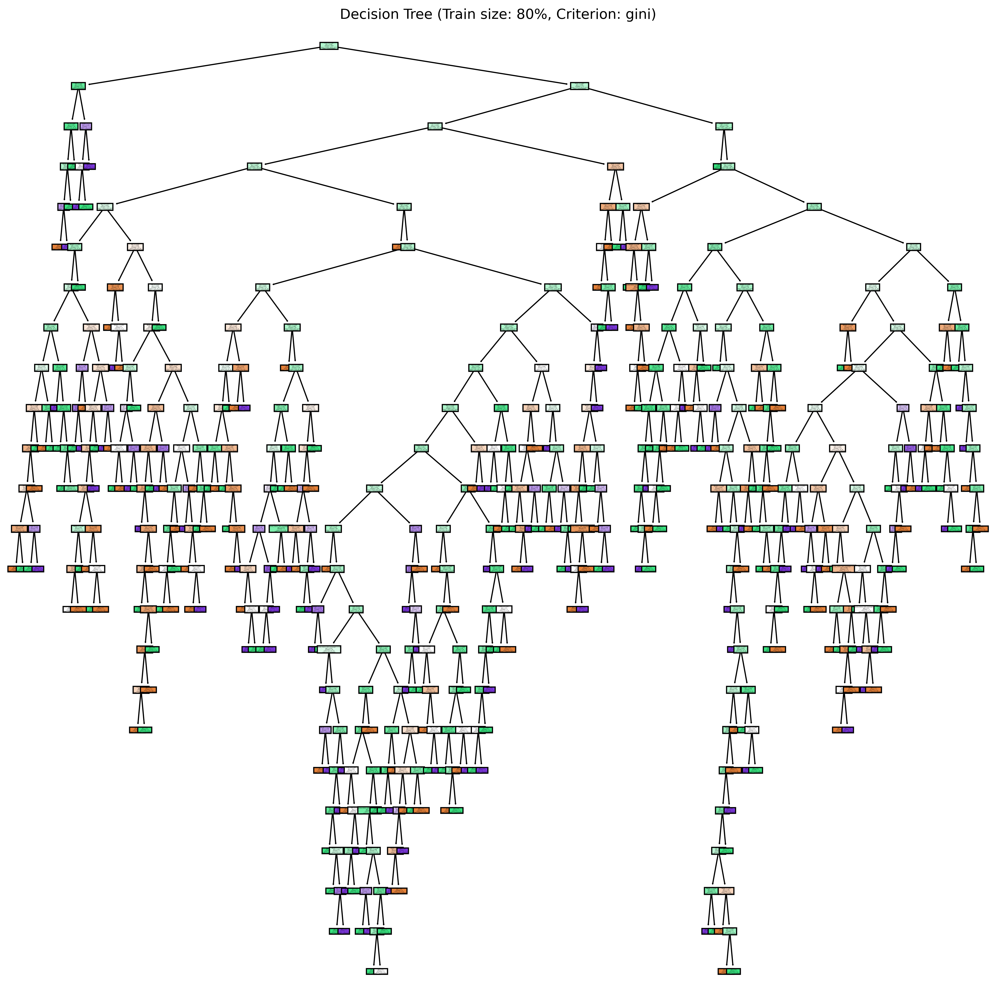

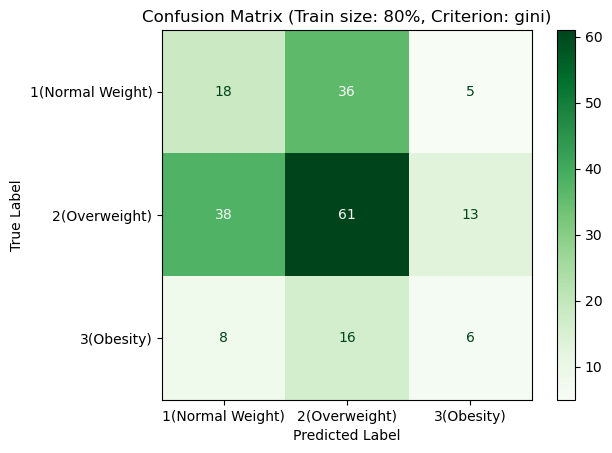

In [57]:
# Third Train Size: 80%, Criterion: 'gini'
train_size = 0.8
criterion = 'gini'
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, random_state=42)

# Initialize and train the Decision Tree model
model = DecisionTreeClassifier(criterion=criterion, random_state=42)
model = model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Train Size: {int(train_size * 100)}%, Criterion: {criterion}, Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


# Visualize the tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 15), dpi=400)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
tree.plot_tree(model, 
          feature_names=fn,
          class_names=[class_labels[1] , class_labels[2], class_labels[3]], 
          filled=True, 

          )
plt.title(f"Decision Tree (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.show()

# Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[1], class_labels[2],class_labels[3]])
disp.plot(cmap=plt.cm.Greens)
plt.title(f"Confusion Matrix (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()



### Decision Tree: 

In this tree, the splitting process begins with the criterion of FCVC ( Do you usually eat vegetables in your meals? ), where samples are segregated based on their FCVC values. The selection of features at each node is determined by their **Gini index** values.

Following the split on FCVC, the tree considers another feature, dividing samples accordingly. Subsequently, this splitting procedure persists for each attribute, guided by their respective Gini index values at each level, until reaching the leaf nodes. These leaf nodes act as terminal points, providing the final classification (whether it indicates normal weight, overweight, or obesity) based on the path followed through the tree.


### confusion matrix:

The confusion matrix represents the performance measurement of the classification model. In this case, we have a 3x3 confusion matrix where each row represents the actual classification, and each column represents the predicted classification. From the results, it appears:<br>
The top-left cell: (18) Number of Normal Weight instances correctly classified as Normal Weight (True Negative for class 1).<br>
Middle cell (61): Number of Overweight instances correctly classified as Overweight (True Positive for class 2).<br>
Bottom-right cell (6): Number of Obesity instances correctly classified as Obesity (True Positive for class 3).<br>

Other cells represent misclassifications:<br>
Top-middle cell (36): Normal Weight instances incorrectly classified as Overweight<br>
Top-right cell (5): Normal Weight instances incorrectly classified as Obesity.<br>
Middle-left cell (38): Overweight instances incorrectly classified as Normal Weight.<br>
Middle-right cell (13): Overweight instances incorrectly classified as Obesity.<br>
Bottom-left cell (8): Obesity instances incorrectly classified as Normal Weight.<br>
Bottom-middle cell (16): Obesity instances incorrectly classified as Overweight.<br>

The diagonal elements (18, 61, and 6) represent correct classifications, while the off-diagonal elements represent the misclassifications.

### Accuracy: 

Accuracy is the proportion of correct predictions out of all predictions made by the model.
In this case, 42% accuracy means that out of all the predictions made on the test set (the remaining 20% of the data), only 42% were correct, This is quite low, and typically, we expect much better performance, especially when we are using 80% of the data for training, which provides a significant amount of information for the model to learn from.

## Evaluate the models of Gini Index:

|       | 60% training, 40% testing | 70% training, 30% testing | 80% training, 20% testing |
| --- | --- | --- | --- |
| Accuracy | 0.38 |   0.40 | 0.42 |

As the amount of training data increases from 60% to 80%, the model's accuracy increases slightly (38% → 40% → 42%). This suggests that more training data does help the model to some extent, but the improvement is relatively small.
we can say that 80% Training / 20% Testing (Accuracy: 0.42) is technically the best in terms of accuracy the split gives the highest accuracy (42%) of the three.



# Information Gain (entropy):

>### Splitting Data into: 60% Training and 40% Test

Train Size: 60%, Criterion: entropy, Accuracy: 0.42
Classification Report:
               precision    recall  f1-score   support

         1.0       0.29      0.22      0.25       119
         2.0       0.52      0.62      0.57       211
         3.0       0.17      0.14      0.15        71

    accuracy                           0.42       401
   macro avg       0.33      0.33      0.32       401
weighted avg       0.39      0.42      0.40       401



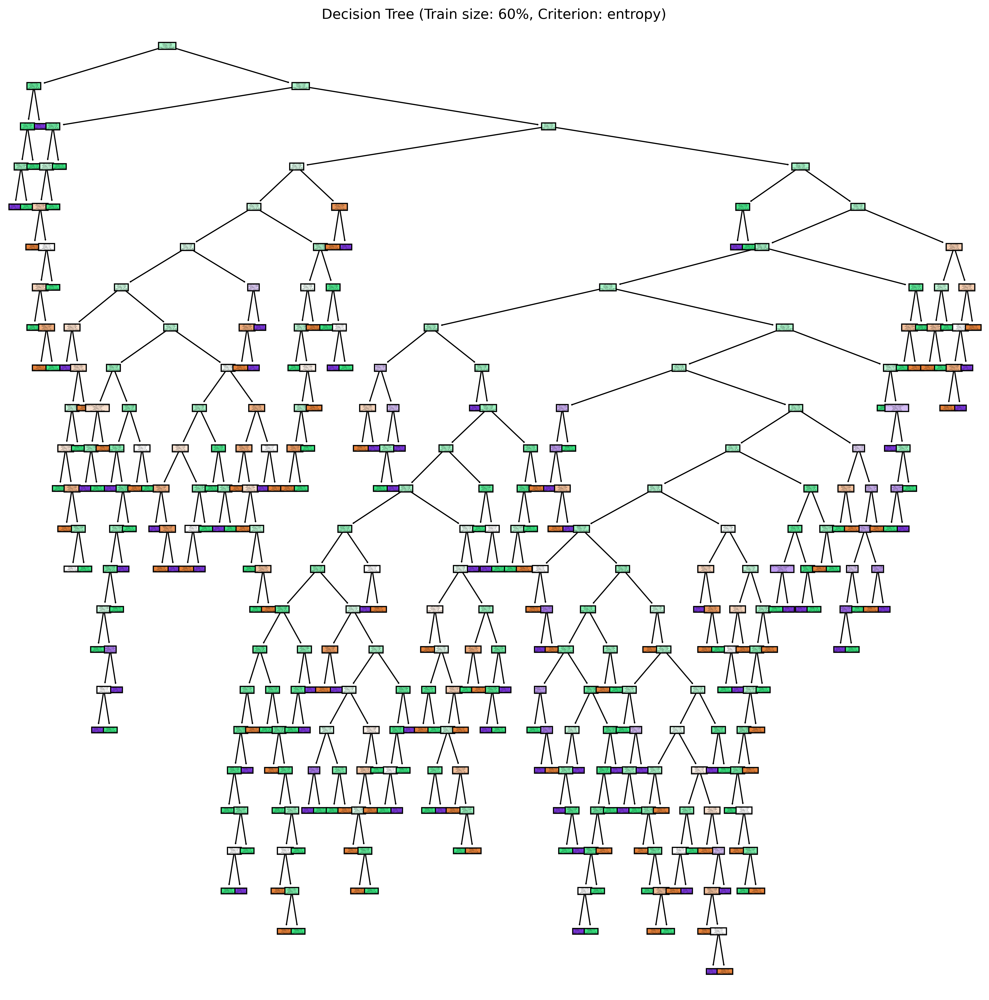

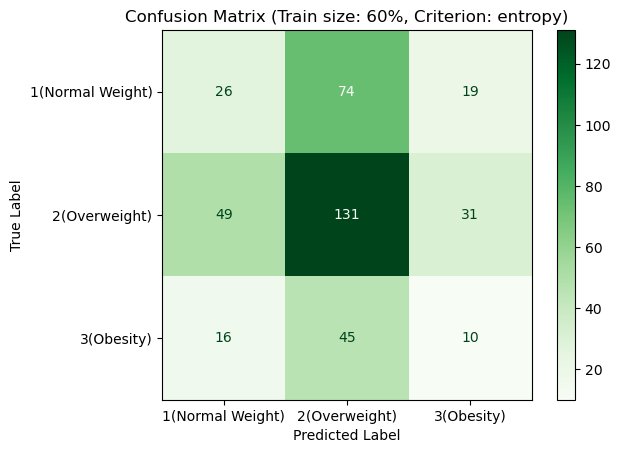

In [58]:
# Criterion: 'entropy', Train Size: 60%
train_size = 0.6
criterion = 'entropy'
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, random_state=42)
# Initialize and train the Decision Tree model
model = DecisionTreeClassifier(criterion=criterion, random_state=42)
model = model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Train Size: {int(train_size * 100)}%, Criterion: {criterion}, Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


# Visualize the tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 15), dpi=400)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
tree.plot_tree(model, 
          feature_names=fn,
          class_names=[class_labels[1] , class_labels[2], class_labels[3]], 
          filled=True, 

          )
plt.title(f"Decision Tree (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.show()

# Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[1], class_labels[2],class_labels[3]])
disp.plot(cmap=plt.cm.Greens)
plt.title(f"Confusion Matrix (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

### Decision Tree: 

In this tree, the splitting process begins with the criterion of FCVC ( Do you usually eat vegetables in your meals? ), where samples are segregated based on their FCVC values. The selection of features at each node is determined by their **Entropy** values.

Following the split on FCVC, the tree considers another feature, dividing samples accordingly. Subsequently, this splitting procedure persists for each attribute, guided by their respective entropy values at each level, until reaching the leaf nodes. These leaf nodes act as terminal points, providing the final classification (whether it indicates normal weight, overweight, or obesity) based on the path followed through the tree.


### confusion matrix:

The confusion matrix represents the performance measurement of the classification model. In this case, we have a 3x3 confusion matrix where each row represents the actual classification, and each column represents the predicted classification. From the results, it appears:<br>
The top-left cell: (26) Number of Normal Weight instances correctly classified as Normal Weight (True Negative for class 1).<br>
Middle cell (131): Number of Overweight instances correctly classified as Overweight (True Positive for class 2).<br>
Bottom-right cell (10): Number of Obesity instances correctly classified as Obesity (True Positive for class 3).<br>

Other cells represent misclassifications:<br>
Top-middle cell (74): Normal Weight instances incorrectly classified as Overweight<br>
Top-right cell (19): Normal Weight instances incorrectly classified as Obesity.<br>
Middle-left cell (49): Overweight instances incorrectly classified as Normal Weight.<br>
Middle-right cell (31): Overweight instances incorrectly classified as Obesity.<br>
Bottom-left cell (16): Obesity instances incorrectly classified as Normal Weight.<br>
Bottom-middle cell (45): Obesity instances incorrectly classified as Overweight.<br>

The diagonal elements (26, 131, and 10) represent correct classifications, while the off-diagonal elements represent the misclassifications.

### Accuracy: 

Accuracy is the proportion of correct predictions out of all predictions made by the model.
In this case, 42% accuracy means that out of all the predictions made on the test set (the remaining 40% of the data), only 42% were correct, This indicates that the model may not be capturing the underlying patterns well, and it is likely struggling to generalize to unseen data.

>### Splitting Data into: 70% Training and 30% Test

Train Size: 70%, Criterion: entropy, Accuracy: 0.42
Classification Report:
               precision    recall  f1-score   support

         1.0       0.33      0.32      0.32        90
         2.0       0.54      0.56      0.55       160
         3.0       0.13      0.12      0.12        51

    accuracy                           0.42       301
   macro avg       0.33      0.33      0.33       301
weighted avg       0.41      0.42      0.41       301



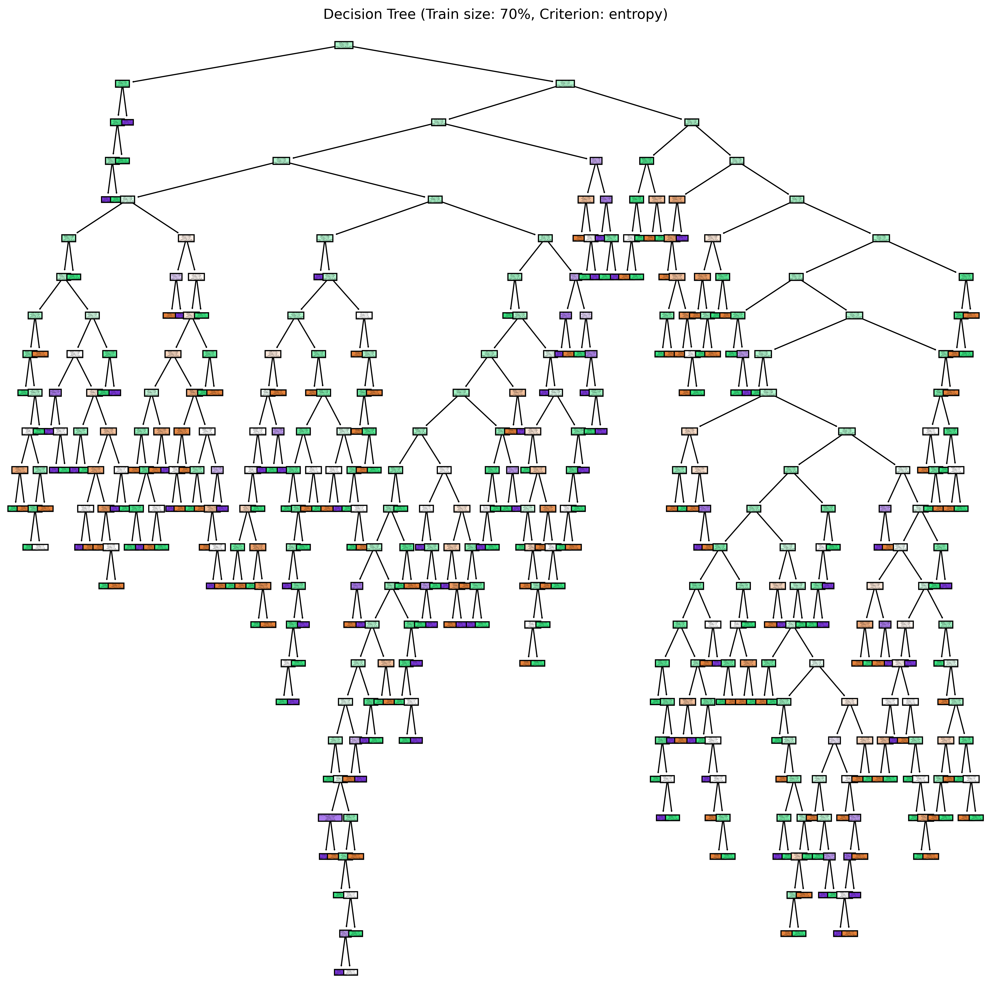

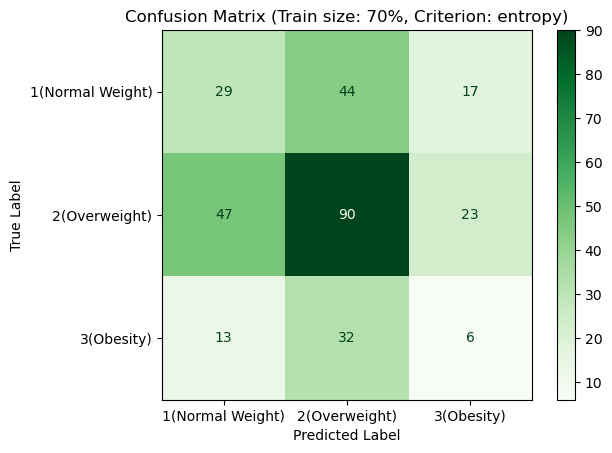

In [59]:
# Criterion: 'entropy', Train Size: 70%
train_size = 0.7
criterion = 'entropy'
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, random_state=42)
# Initialize and train the Decision Tree model
model = DecisionTreeClassifier(criterion=criterion, random_state=42)
model = model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Train Size: {int(train_size * 100)}%, Criterion: {criterion}, Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


# Visualize the tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 15), dpi=400)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
tree.plot_tree(model, 
          feature_names=fn,
          class_names=[class_labels[1] , class_labels[2], class_labels[3]], 
          filled=True, 

          )
plt.title(f"Decision Tree (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.show()

# Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[1], class_labels[2],class_labels[3]])
disp.plot(cmap=plt.cm.Greens)
plt.title(f"Confusion Matrix (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

### Decision Tree: 

In this tree, the splitting process begins with the criterion of FCVC ( Do you usually eat vegetables in your meals? ), where samples are segregated based on their FCVC values. The selection of features at each node is determined by their **Entropy** values.

Following the split on FCVC, the tree considers another feature, dividing samples accordingly. Subsequently, this splitting procedure persists for each attribute, guided by their respective entropy values at each level, until reaching the leaf nodes. These leaf nodes act as terminal points, providing the final classification (whether it indicates normal weight, overweight, or obesity) based on the path followed through the tree.


### confusion matrix:

The confusion matrix represents the performance measurement of the classification model. In this case, we have a 3x3 confusion matrix where each row represents the actual classification, and each column represents the predicted classification. From the results, it appears:<br>
The top-left cell: (29) Number of Normal Weight instances correctly classified as Normal Weight (True Negative for class 1).<br>
Middle cell (90): Number of Overweight instances correctly classified as Overweight (True Positive for class 2).<br>
Bottom-right cell (6): Number of Obesity instances correctly classified as Obesity (True Positive for class 3).<br>

Other cells represent misclassifications:<br>
Top-middle cell (44): Normal Weight instances incorrectly classified as Overweight<br>
Top-right cell (17): Normal Weight instances incorrectly classified as Obesity.<br>
Middle-left cell (47): Overweight instances incorrectly classified as Normal Weight.<br>
Middle-right cell (23): Overweight instances incorrectly classified as Obesity.<br>
Bottom-left cell (13): Obesity instances incorrectly classified as Normal Weight.<br>
Bottom-middle cell (32): Obesity instances incorrectly classified as Overweight.<br>

The diagonal elements (29, 90, and 6) represent correct classifications, while the off-diagonal elements represent the misclassifications.

### Accuracy: 

Accuracy is the proportion of correct predictions out of all predictions made by the model.
In this case, 42% accuracy means that out of all the predictions made on the test set (the remaining 30% of the data), only 42% were correct, it suggests that the model is performing poorly, as it is only correctly predicting 42% of the instances in the test set.

>### Splitting Data into: 80% Training and 20% Test

Train Size: 80%, Criterion: entropy, Accuracy: 0.40
Classification Report:
               precision    recall  f1-score   support

         1.0       0.30      0.32      0.31        59
         2.0       0.55      0.53      0.54       112
         3.0       0.10      0.10      0.10        30

    accuracy                           0.40       201
   macro avg       0.32      0.32      0.32       201
weighted avg       0.41      0.40      0.41       201



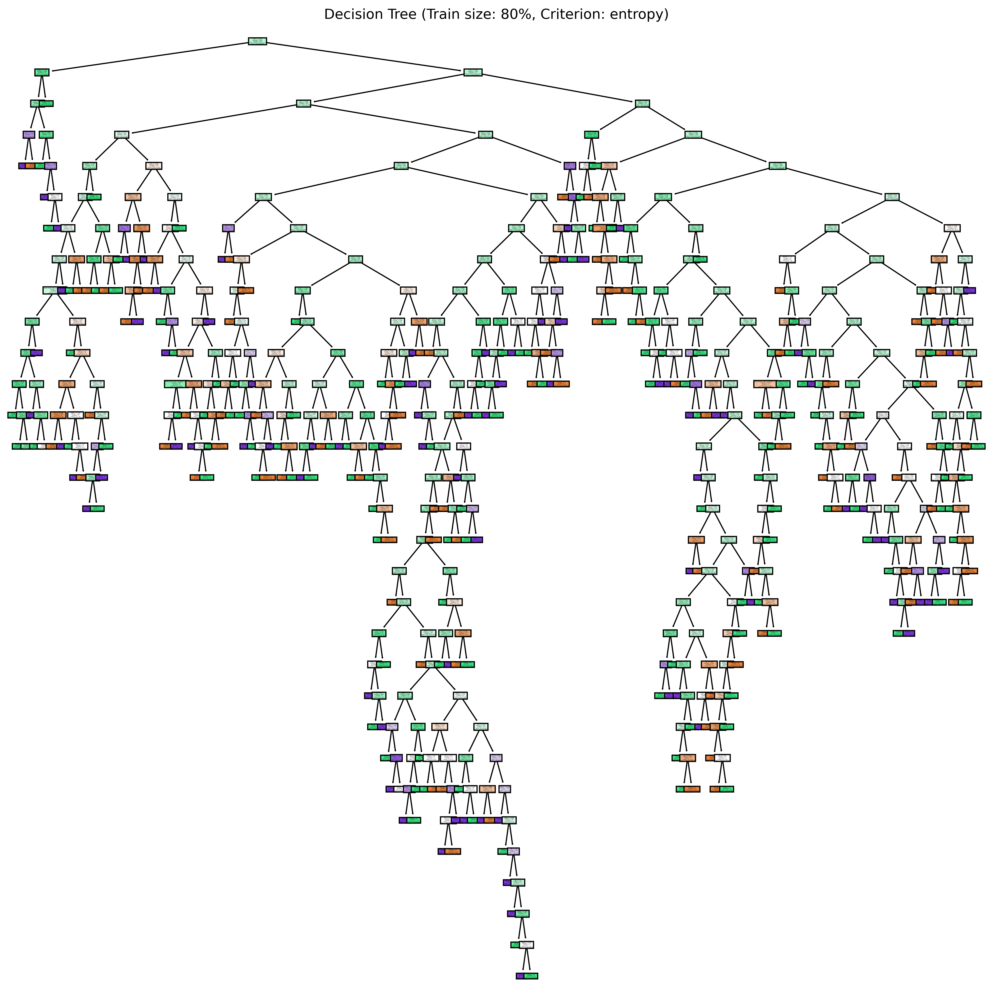

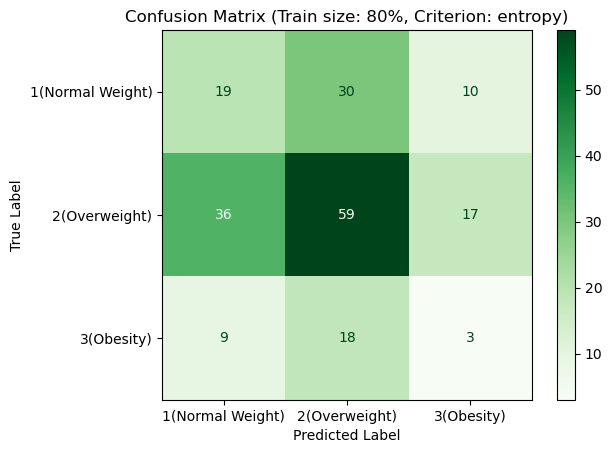

In [60]:
# Criterion: 'entropy', Train Size: 80%
train_size = 0.8
criterion = 'entropy'
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=train_size, random_state=42)
# Initialize and train the Decision Tree model
model = DecisionTreeClassifier(criterion=criterion, random_state=42)
model = model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Train Size: {int(train_size * 100)}%, Criterion: {criterion}, Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


# Visualize the tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 15), dpi=400)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
tree.plot_tree(model, 
          feature_names=fn,
          class_names=[class_labels[1] , class_labels[2], class_labels[3]], 
          filled=True, 

          )
plt.title(f"Decision Tree (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.show()

# Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
class_labels = {1: '1(Normal Weight)', 2: '2(Overweight)', 3:'3(Obesity)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[1], class_labels[2],class_labels[3]])
disp.plot(cmap=plt.cm.Greens)
plt.title(f"Confusion Matrix (Train size: {int(train_size * 100)}%, Criterion: {criterion})")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

### Decision Tree: 

In this tree, the splitting process begins with the criterion of FCVC ( Do you usually eat vegetables in your meals? ), where samples are segregated based on their FCVC values. The selection of features at each node is determined by their **Entropy** values.

Following the split on FCVC, the tree considers another feature, dividing samples accordingly. Subsequently, this splitting procedure persists for each attribute, guided by their respective entropy values at each level, until reaching the leaf nodes. These leaf nodes act as terminal points, providing the final classification (whether it indicates normal weight, overweight, or obesity) based on the path followed through the tree.


### confusion matrix:

The confusion matrix represents the performance measurement of the classification model. In this case, we have a 3x3 confusion matrix where each row represents the actual classification, and each column represents the predicted classification. From the results, it appears:<br>
The top-left cell: (19) Number of Normal Weight instances correctly classified as Normal Weight (True Negative for class 1).<br>
Middle cell (59): Number of Overweight instances correctly classified as Overweight (True Positive for class 2).<br>
Bottom-right cell (3): Number of Obesity instances correctly classified as Obesity (True Positive for class 3).<br>

Other cells represent misclassifications:<br>
Top-middle cell (30): Normal Weight instances incorrectly classified as Overweight<br>
Top-right cell (10): Normal Weight instances incorrectly classified as Obesity.<br>
Middle-left cell (36): Obesity instances incorrectly classified as Normal Weight.<br>
Middle-right cell (17): Overweight instances incorrectly classified as Obesity.<br>
Bottom-left cell (9): Obesity instances incorrectly classified as Normal Weight.<br>
Bottom-middle cell (18): Obesity instances incorrectly classified as Overweight.<br>

The diagonal elements (19, 59, and 3) represent correct classifications, while the off-diagonal elements represent the misclassifications.

### Accuracy: 

Accuracy is the proportion of correct predictions out of all predictions made by the model.
In this case, 40% accuracy means that out of all the predictions made on the test set (the remaining 20% of the data), only 40% were correct,it still indicates that the model is underperforming, even though it has a larger portion of the data for training.

## Evaluate the models of INFORMATION GAIN(Entropy) :

|       | 60% training, 40% testing | 70% training, 30% testing | 80% training, 20% testing |
| --- | --- | --- | --- |
| Accuracy | 0.42 |   0.42 | 0.40 |

The accuracy values remain relatively similar (42% for both 60% and 70% training data), and even decrease slightly when using 80% training data (to 40% accuracy).
All three splits are producing similar low accuracy values (~42% for 60% and 70% training, 40% for 80% training) so we think  70% training / 30% testing might be a good balance of both training and testing data, offering slightly more training data while still maintaining a reasonably large test set.

## The best model between information gain and the Gini index:

After selecting the best model split from Gini index, which was 80% training, 20% testing, and the best split from Information Gain, which was 70% training, 30% testing, we reviewed the value of each for comparison between Information Gain and Gini Index, and we reached the following conclusion:

|       | Information gain | Gini index |
| --- | --- | --- |
| Accuracy | 0.42| 0.42 | 

Based on Accuracy Both the Information Gain model (with 70% training and 30% testing) and the Gini Index model (with 80% training and 20% testing) produced identical accuracy scores of 0.42.
Gini Index Model (80% training): More data for training might have helped the model learn more patterns, but the smaller test set (20%) may have reduced the reliability of the performance evaluation. A smaller test set could introduce more variability in the accuracy estimate, although the result was consistent with the Information Gain model.
Information Gain Model (70% training): While the training data is slightly smaller, it has a larger test set (30%), which provides a more reliable performance evaluation. However, the model still yielded the same 42% accuracy.
conclution:
both methods are equally effective in this case, but Information Gain with a 70%-30% split might offer a slight edge in terms of a more stable evaluation.This difference is minor in terms of performance impact (both models have the same accuracy of 42%), but more data for testing tends to provide a better estimate of a model's ability to generalize.

